# 1. importing modules

In [5]:
%matplotlib inline
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from joblib import dump, load
import pickle
from collections import OrderedDict

# loading machine learning modules
import sklearn
import nltk
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans

from dataset_collector_saver_class import LoadDataset
from folder_iterator_class import FolderIterator
#directory,*,tar_names=None,Type=None,rmChar=False,_dict=False,folder_name=False


# 2. loading dataset

In [6]:
math_path = '/home/ngoni97/Documents/Documents/File Manager with ML/train_test_text_files/MATHEMATICS'

prog_path = '/home/ngoni97/Documents/Documents/File Manager with ML/train_test_text_files/Python Programming'



prog_path = '/home/ngoni97/Documents/Documents/File Manager with ML/train_test_text_files/Python Programming'
prog_label = [os.path.basename(prog_path)]*len(os.listdir(prog_path))
#label
# all labels combined
label = math_label + physic_label + prog_label


In [7]:
def remove_characters_before_tokenization(sentence,keep_apostrophes=False):
    import re
    # string
    sentence = (sentence.replace('_', ' ')).replace('-', ' ')
    # bytes
    #b_sentence = (sentence.replace(b'_', b' ')).replace(b'-', b' ')
        
    # string
    PATTERN = re.compile('[?|$|&|*|%|@|(|)|~]') # add other characters here to remove them
    pattern = re.compile('[^a-zA-Z]') # remove numbers
    replacement = r' '
    # bytes
    b_PATTERN = re.compile(b'[?|$|&|*|%|@|(|)|~]') # add other characters here to remove them
    b_pattern = re.compile(b'[^a-zA-Z]') # remove numbers
    b_replacement = re.compile(b' ')
        
    if keep_apostrophes:
        filtered_sentence = re.sub(pattern, replacement, re.sub(PATTERN, replacement, sentence))
    else:
        filtered_sentence = re.sub(pattern, replacement, re.sub(PATTERN, replacement, sentence))
    return filtered_sentence.lower()   


In [8]:
def dataCollector(path, clean=False):
    import os
    Data = {}
    for item in os.listdir(path):
        new_path = os.path.join(path, item)
        with open(new_path, 'r') as file:
            try:
                text = file.read()
            except Exception as e:
                pass
            else:
                if clean == True:
                    test = remove_characters_before_tokenization(text)
                    if test != ' ':
                        Data[item] = remove_characters_before_tokenization(text)
                    elif test == ' ':
                        pass
                else:
                    Data[item] = text
    return Data


leaving out empty files, will write code in the future that takes care of reading scanned pdf's

In [9]:
math_test_data = dataCollector(math_path, True)
prog_test_data = dataCollector(prog_path, True)

math_label = [os.path.basename(math_path)]*len(math_test_data)
prog_label = [os.path.basename(prog_path)]*len(prog_test_data)


In [10]:
label = math_label + prog_label
data = list(math_test_data.keys()) + list(prog_test_data.keys())
Data = list(math_test_data.values()) + list(prog_test_data.values())


In [11]:
len(Data) == len(list(math_test_data.values())) + len(list(prog_test_data.values())) == len(label)


True

prog_test_data
#val = 'Advanced book on Mathematics Olympiad ( PDFDrive.com ).txt'
#val in math_test_data.keys()
#type(math_test_data[val])
Val = 'Hacking_APIs_Breaking_Web_Application_Programming_Interfaces_Final.txt'
Val in prog_test_data.keys()

In [12]:
len(prog_test_data)


237

In [13]:
len(math_test_data)==len(math_label)


True

physic_test_data = dataCollector(physic_path, True)
prog_test_data = dataCollector(prog_path, True)


# fix the issue of empty text documents

In [14]:
# cleaning data

roman_numerals = ['i', 'ii', 'iii', 'iv', 'v', 'vi', 'vii', 'viii', 'ix', 'x',
                   'xi', 'xii', 'xiii', 'xiv', 'xv', 'xvi', 'xvii', 'xviii', 'xix', 'xx']
cardinals = ['nd', 'rd', 'th']
stop_words = nltk.corpus.stopwords.words('english')
stop_words = stop_words + list('qwertyuiopasdfghjklzxcvbnm') + roman_numerals + cardinals

wpt = nltk.WordPunctTokenizer()
def normalize_document(doc):
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z0-9\s]', '', doc, re.I)
    doc = doc.lower()
    doc = doc.strip()
    # tokenize document
    tokens = wpt.tokenize(doc)
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    # re-create document from filtered tokens
    doc = ' '.join(filtered_tokens)
    return doc

normalize_corpus = np.vectorize(normalize_document)

Norm = normalize_corpus(Data)
Norm


array(['contents green function second order equations construction green function construction green function second order equations observation sturm theory introduction self adjoint equations second order basic results sturm theory separation comparison theorem nonlinear theory introduction elementary critical points system linear equations classi cation critical points critical points stability linear systems stability lyapunov method simple critical points nonlinear systems linearization introduction isolated critical points stability isolated critical points trouble centers conservative equations analytical numerical methods differential equations adomian decomposition method convergence analysis adomian decomposition method modi ed adomian decomposition method application modi ed adomian decomposition method numerical examples homotopy analysis method basic idea homotopy analysis method basic idea homotopy perturbation method differential transform method contents differential t

In [15]:
# vectorising the text

vectoriser = TfidfVectorizer(min_df=7, max_df=42, use_idf=True, max_features=5000)
Vectoriser = CountVectorizer(min_df=3, max_df=29)#, max_features=1000)
X = vectoriser.fit_transform(Norm)
Y = Vectoriser.fit_transform(Norm)
print(len(vectoriser.get_feature_names_out()))
print(len(Vectoriser.get_feature_names_out()))


5000
15713


In [16]:
vectoriser_matrix = X.toarray()
Vectoriser_matrix = Y.toarray()

vocab = vectoriser.get_feature_names_out()
Vocab = Vectoriser.get_feature_names_out()
DF = pd.DataFrame(np.round(vectoriser_matrix, 2), columns=vocab)
display(DF)


,aa,abbreviation,abbreviations,abc,abe,abel,abilities,ables,abnormal,abraham,...,zn,zone,zones,zoom,zorich,zorn,zu,zum,zur,zx
0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.00,0.0,0.0,0.0,0.02,0.00,0.0,0.0,0.03,...,0.02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
654,0.0,0.11,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
655,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
656,0.0,0.00,0.0,0.0,0.0,0.00,0.05,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
657,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
vectoriser_matrix
#len(vectoriser_matrix)


array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.10303406, 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [18]:
DF_ = pd.DataFrame(np.round(Vectoriser_matrix, 2), columns=Vocab)
display(DF_)


,aa,aaa,aaai,aal,aalto,aar,aaron,aarule,abandon,abandoned,...,zwei,zweite,zwillinger,zwillingerbooks,zwischen,zwischenergebnissen,zwischenschritten,zx,zygmund,zz
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
654,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
655,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
656,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [19]:
from sklearn.decomposition import LatentDirichletAllocation

number_components = 100
lda = LatentDirichletAllocation(n_components=number_components, max_iter=100, random_state=42)
dt_matrix = lda.fit_transform(vectoriser_matrix)
columns = [i for i in range(number_components)]
features = pd.DataFrame(dt_matrix, columns=columns)
display(features)


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,...,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425,0.002425
1,0.000990,0.000990,0.014763,0.000990,0.000990,0.008285,0.000990,0.000990,0.000990,0.000990,...,0.007923,0.007923,0.109057,0.000990,0.015513,0.000990,0.000990,0.000990,0.039799,0.000990
2,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,...,0.000962,0.000962,0.028348,0.000962,0.000962,0.000962,0.000962,0.000962,0.037569,0.000962
3,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,...,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396,0.002396
4,0.000525,0.000525,0.000525,0.000525,0.000525,0.000525,0.000525,0.000525,0.000525,0.018063,...,0.000525,0.000525,0.063161,0.000525,0.000525,0.000525,0.000525,0.000525,0.205432,0.000525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
654,0.000717,0.000717,0.000717,0.000717,0.000717,0.000717,0.000717,0.000717,0.000717,0.000825,...,0.000717,0.000717,0.108274,0.000717,0.097901,0.000717,0.000717,0.001018,0.012566,0.000717
655,0.001237,0.105035,0.001237,0.001237,0.001237,0.001237,0.001237,0.001237,0.035554,0.001237,...,0.001237,0.001237,0.075083,0.001237,0.001237,0.001237,0.001237,0.001237,0.138046,0.001237
656,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.005108,...,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.000903,0.116246,0.000903
657,0.001110,0.001110,0.001110,0.001110,0.001110,0.001110,0.001110,0.001110,0.001110,0.001110,...,0.001110,0.001110,0.088013,0.001110,0.001110,0.001110,0.001110,0.001110,0.555604,0.001110


In [20]:
number_components = 50
Lda = LatentDirichletAllocation(n_components=number_components, max_iter=100, random_state=42)
dt_matrix = Lda.fit_transform(Vectoriser_matrix)


In [21]:
topic_term_matrix = lda.components_
for topic_weights in topic_term_matrix:
    topic = [(token, weight) for token, weight in zip(vocab, topic_weights)]
    topic = sorted(topic, key=lambda x: -x[1])
    topic = [item for item in topic if item[1] > 1.0]
    print(topic)
    print(len(topic))


[]
0
[('git', 4.694197482964824), ('gate', 1.769624284271911), ('grover', 1.4660902506017615), ('gates', 1.3489780652341876), ('spin', 1.3182291253497478), ('entanglement', 1.0983959337397837), ('qubit', 1.0259201743142998)]
7
[('ffi', 1.8546711458250968), ('evaluate', 1.4046074025576605)]
2
[]
0
[('arr', 4.846667789731828), ('ufuncs', 4.52180197459179), ('ipython', 2.6573178731432274), ('lcm', 1.858770931834908), ('gcd', 1.5729221788221706), ('ufunc', 1.2969880288965203), ('calculate', 1.2920521204970639), ('cumulative', 1.1886508411467218), ('pythoncopy', 1.1864905929857434)]
9
[]
0
[]
0
[('sql', 3.524354595415116), ('queries', 1.6855062589050926), ('query', 1.27377335555176)]
3
[('eq', 1.1107891211605543)]
1
[('int', 2.1537109518898383), ('assignments', 2.1095468635743266), ('scipy', 1.8738290195349327), ('acquisition', 1.8514679345801754), ('closing', 1.8441472913760608), ('ni', 1.804880382454174), ('raspberry', 1.8011624652068274), ('matching', 1.7586439781408323), ('discusses', 1

In [22]:
Topic_term_matrix = Lda.components_
for topic_weights in Topic_term_matrix:
    topic = [(token, weight) for token, weight in zip(Vocab, topic_weights)]
    topic = sorted(topic, key=lambda x: -x[1])
    topic = [item for item in topic if item[1] > 1.0]
    print(topic)
    print(len(topic))


[('ipython', 43.02130907436494), ('stars', 35.64413878245824), ('recipes', 34.96713893812382), ('hint', 33.237820157930095), ('automata', 28.506427492153122), ('routines', 26.763295221589463), ('shutterstock', 25.01999999999733), ('turing', 23.14555291744301), ('measurements', 23.060393158725873), ('entanglement', 20.60660607019885), ('wedderburn', 20.592982157112157), ('smoothing', 20.01999999999849), ('eq', 19.811163682851753), ('fa', 17.019999999996816), ('functors', 16.56459037736017), ('dence', 16.485492552694236), ('polya', 16.063934039620328), ('ibtp', 16.019999999998507), ('ivancevic', 16.019999999998507), ('robotics', 15.52141535832557), ('gates', 15.31406091890411), ('discriminant', 15.057580619740992), ('seminars', 15.02741018653676), ('xy', 15.019999999998499), ('reported', 15.019999999998225), ('queueing', 14.045700295151617), ('artin', 13.760747741377545), ('italy', 13.606312716155905), ('bands', 13.019999999996438), ('typeset', 13.009398964329447), ('brauer', 12.89041625

# 3. encoding labels

In [23]:
label_encoder = LabelEncoder()
enc_labels = label_encoder.fit_transform(label)
enc_labels


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
# inversely transforming the encoded labels

inverse_labels = label_encoder.inverse_transform(enc_labels)
inverse_labels


array(['MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS',
       'MATHEMATICS', 'MATHEMATICS', 'MATHEMATICS', 'MATHEMATI

# 4. displaying data

In [24]:
df = pd.concat([pd.DataFrame({'data':data, 'labels':label})
                , pd.DataFrame(enc_labels, columns=['encoded labels'])], axis=1)
display(df)


,data,labels,encoded labels
0,Differential and Difference Equations with App...,MATHEMATICS,0
1,"Mathematical Modeling_ Models, Analysis and Ap...",MATHEMATICS,0
2,1300_math_formulas.txt,MATHEMATICS,0
3,3000 Solved Problems in Calculus ( PDFDrive.co...,MATHEMATICS,0
4,536 Puzzles and Curious Problems.txt,MATHEMATICS,0
...,...,...,...
654,Black_hat_Python_Python_programming_for_hacker...,Python Programming,1
655,Building AI Applications with ChatGPT APIs.txt,Python Programming,1
656,Challenging Programming in Python.txt,Python Programming,1
657,ChatGPT Your Python Coach.txt,Python Programming,1


# 5. creating model

In [25]:
import sklearn.naive_bayes


MODEL_A = make_pipeline(TfidfVectorizer(),MultinomialNB(alpha=0.5))
# ComplementNB was made to correct the "severe assumptions" made by the standard MultinomialNB classifier
# it is particularly useful for imbalanced datasets
MODEL_B = make_pipeline(TfidfVectorizer(), sklearn.naive_bayes.ComplementNB())

MODEL_C = make_pipeline(TfidfVectorizer(), sklearn.svm.LinearSVC())

MODEL_D = make_pipeline(CountVectorizer(), sklearn.naive_bayes.MultinomialNB())

# max_df, max_features; do feature selection
# try the sklearn.naive_bayes.MultinomialNB


# 6. training model

In [26]:
Normalised_Data = Norm


In [27]:
X_train, X_test, y_train, y_test = train_test_split(Normalised_Data, enc_labels, test_size=0.2, random_state=42)


In [28]:
X_train


array(['forced systems method undetermined coef cients periodically forced oscillations method variation parameters initial value green functions cauchy euler equations numerical solutions odes euler method higher order taylor methods runge kutta methods numerical applications nonlinear pendulum extreme sky diving flight sports balls falling raindrops two body problem expanding universe coef cient drag linear systems coupled oscillators planar systems equilibrium solutions nearby behaviors polar representation spirals problems linear algebra finite dimensional vector spaces linear transformations active passive rotations rotation matrices matrix representations matrix inverses determinants cramer rule eigenvalue problems introduction coupled systems eigenvalue problems rotations conics matrix formulation planar systems solving constant coef cient systems examples matrix method planar systems summary applications mass spring systems circuits mixture problems chemical kinetics copyright 

In [29]:
len(X_test)


132

In [30]:
len(y_train), len(y_test)


(527, 132)

In [31]:
MODEL_A.fit(X_train, y_train)


Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('multinomialnb', MultinomialNB(alpha=0.5))])

In [32]:
MODEL_B.fit(X_train, y_train)


Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('complementnb', ComplementNB())])

In [33]:
MODEL_C.fit(X_train, y_train)


Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('linearsvc', LinearSVC())])

In [34]:
MODEL_D.fit(X_train, y_train)


Pipeline(steps=[('countvectorizer', CountVectorizer()),
                ('multinomialnb', MultinomialNB())])

# 7. predicting

In [35]:
y_pred = MODEL_A.predict(X_test)
Y_pred = MODEL_B.predict(X_test)
Y_Pred = MODEL_C.predict(X_test)
Y_PRED = MODEL_D.predict(X_test)


In [36]:
len(Y_pred)


132

In [37]:
print("Test set score: {:.2f}".format(MODEL_A.score(X_test, y_test)))
print("Test set score: {:.2f}".format(MODEL_B.score(X_test, y_test)))
print("Test set score: {:.2f}".format(MODEL_C.score(X_test, y_test)))
print("Test set score: {:.2f}".format(MODEL_D.score(X_test, y_test)))


Test set score: 0.98
Test set score: 0.98
Test set score: 0.98
Test set score: 0.99


In [38]:
len(y_pred)


132

In [39]:
test = ['solving differential equations using transforms']
#MODEL_A.predict(test)
MODEL_D.predict(test)


array([0])

In [40]:
MODEL_A.predict(test)


array([0])

In [41]:
MODEL_B.predict(test)


array([0])

In [42]:
MODEL_D.predict(['classification'])


array([1])

In [43]:
#MODEL_A.predict(['machine learning and artificial intelligence'])
MODEL_D.predict(['machine learning and artificial intelligence'])


array([1])

In [ ]:
pred = MODEL_D.predict(['machine learning and artificial intelligence'])

category = label_encoder.inverse_transform(pred)
category


array(['Python Programming'], dtype='<U18')

In [44]:
MODEL_B.predict(['machine learning and artificial intelligence'])


array([1])

In [45]:
MODEL_A.predict(['machine learning and artificial intelligence'])


array([1])

In [57]:
MODEL_C.predict(['machine learning and artificial intelligence'])


array([1])

In [47]:
# i need more data
# my models are not working properly
# they are biased due to lack of trainig data
# hence onto plan B that i had reserved for the premium version
# which is to use


# 8. creating a confusion matrix and heat map

In [48]:
from sklearn.model_selection import cross_val_predict
Y_pred_ = cross_val_predict(MODEL_A, X_train, y_train, cv=3)


mat = confusion_matrix(y_pred, y_test)
mat


array([[87,  2],
       [ 0, 43]])

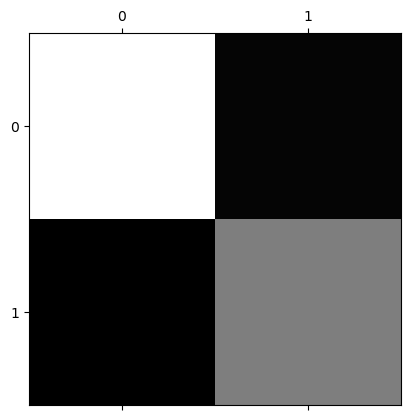

In [49]:
plt.matshow(mat,cmap=plt.cm.gray)
plt.show()


In [50]:
# it is working but now am lost about the answer I was looking for in the beginning
# so I need to redefine the problem in order to explain the answer


In [51]:
Mat = confusion_matrix(Y_Pred, y_test)
Mat


array([[87,  2],
       [ 0, 43]])

In [52]:
MAT = confusion_matrix(Y_pred, y_test)
MAT


array([[87,  3],
       [ 0, 42]])

In [53]:
# save my model as a pickle file and a write the loaded data as a csv file


# 9. Saving models

In [54]:
with open('model_a.pkl', 'wb') as file:
    pickle.dump(MODEL_A, file)

with open('model_b.pkl', 'wb') as file:
    pickle.dump(MODEL_B, file)

with open('model_c.pkl', 'wb') as file:
    pickle.dump(MODEL_C, file)

with open('model_d.pkl', 'wb') as file:
    pickle.dump(MODEL_D, file)


In [55]:
with open('model_d.pkl', 'rb') as file:
    my_model_a = pickle.load(file)

my_model_a.predict(['topology is set theory in higher dimensions'])


array([0])

In [56]:
# add cross-validation and grid-searchcv for finding the best parameters
